# **Лабораторная работа №1**
**Чаплин Виталий (гр.5130901/10202)**

# Упражнение 1.2

In [ ]:
# Get thinkdsp.py

import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py

Загрузим образец звука и исследуем его различными способами.

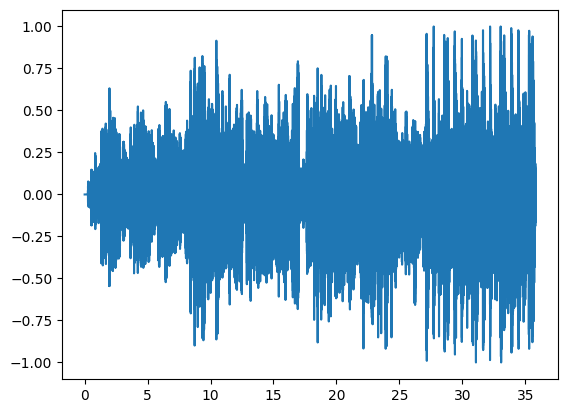

In [ ]:
from thinkdsp import read_wave

filename = 'whistle.wav'
wave = read_wave(filename)
wave.plot()
wave.make_audio()

Далее выделим промежуток длительностью 0.5 секунд, в котором высота постоянна.

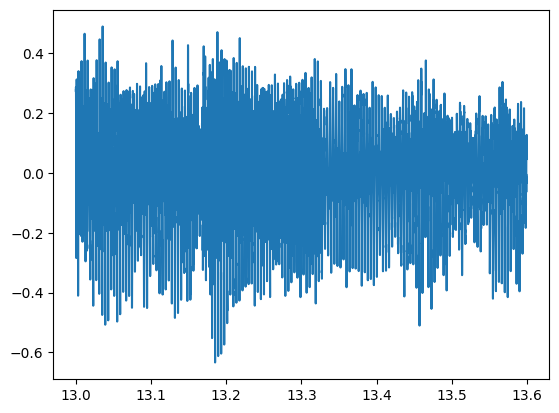

In [ ]:
start = 13
duration = 0.6
segment = wave.segment(start, duration)
segment.plot()
segment.make_audio()

Получим спектр выбранного фрагмента.

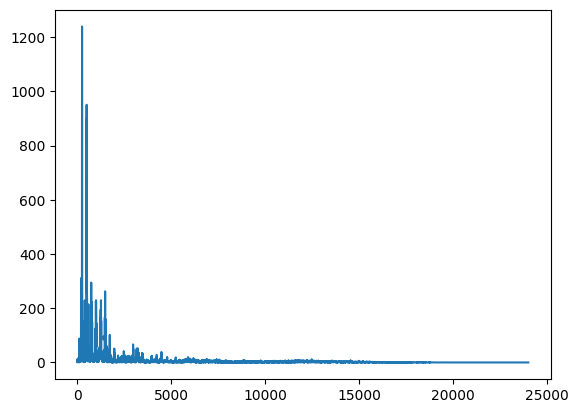

In [ ]:
spectrum = segment.make_spectrum()
spectrum.plot()

Видно, что в выбранном сегменте значительно преобладают низкие частоты.

Ограничим рассматриваемую частоту до 2000 Гц, чтобы посмотреть, какие частоты являются доминирующими в данном фрагменте.

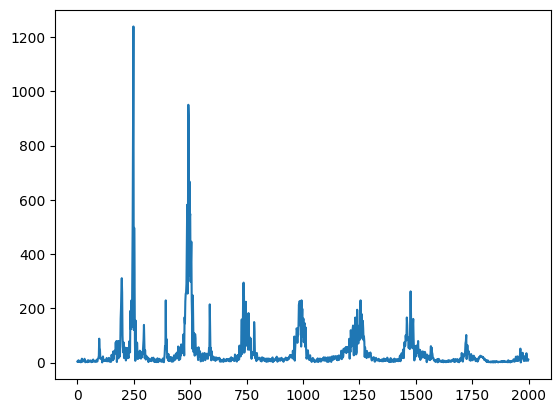

In [ ]:
spectrum.plot(high=2000)

In [ ]:
spectrum.peaks()[:5]

[(1239.268904121457, 248.33333333333334),
 (950.4863160906763, 491.6666666666667),
 (898.948242002891, 493.33333333333337),
 (885.1150012834713, 246.66666666666669),
 (667.6907756068418, 496.6666666666667)]

Видим, что самое большое число находится на отметке ~250 Гц.

Воспользуемся методом low_pass, который ослабляет все частотные составляющие выше частоты среза.

In [ ]:
spectrum1 = segment.make_spectrum()
spectrum1.low_pass(2000)
spectrum1.make_wave().make_audio()

Звук стал ниже.

Теперь воспользуемся методом high_pass и отбросим частоты ниже 2000 Гц.

In [ ]:
spectrum2 = segment.make_spectrum()
spectrum2.high_pass(4000)
spectrum2.make_wave().make_audio()

Звук стал выше.

Теперь при помощи band_stop отбросим все частоты вне диапазона 1000-5000 Гц.

In [ ]:
spectrum3 = segment.make_spectrum()
spectrum3.band_stop(1000,5000)
spectrum3.make_wave().make_audio()

# Упражнение 1.3

Создадим сложный сигнал из объектов SinSignal и CosSignal, суммируя их.

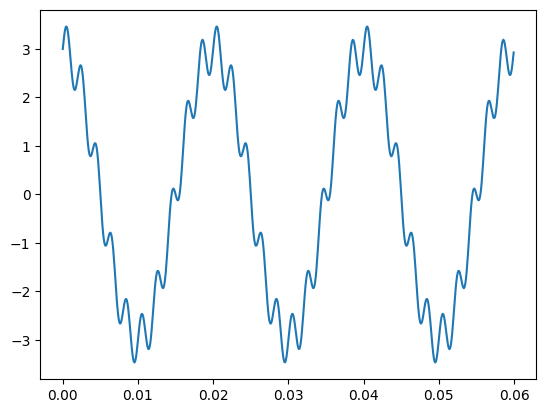

In [ ]:
from thinkdsp import CosSignal, SinSignal

cos_sig = CosSignal(freq=50, amp=3, offset=0)
sin_sig = SinSignal(freq=500, amp=0.5, offset=0)
mix = sin_sig + cos_sig
mix.plot()
wave2 = mix.make_wave()
wave2.make_audio()

Вычислим спектр данного сигнала.

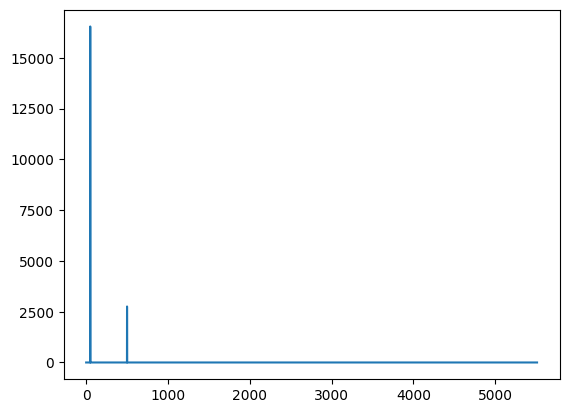

In [ ]:
spectrum4 = wave2.make_spectrum()
spectrum4.plot()

Добавим частотные компоненты, не кратные основным.

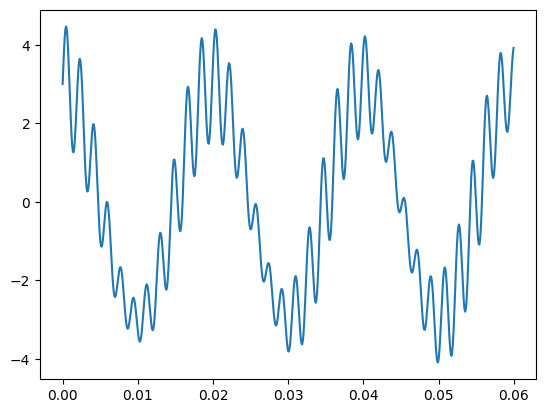

In [ ]:
mix += SinSignal(freq=555)
mix.plot()
mix.make_wave().make_audio()

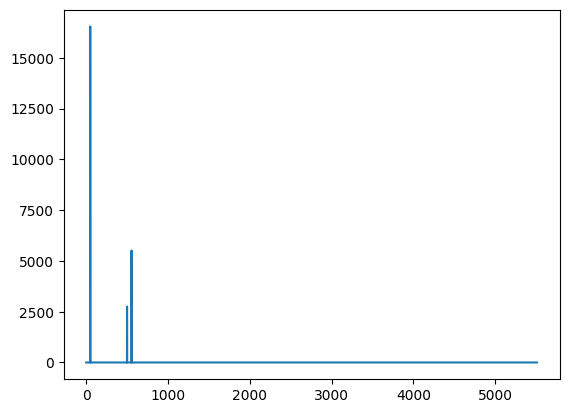

In [ ]:
spectrum5 = mix.make_wave().make_spectrum()
spectrum5.plot()

При добавлении частотных компонент, не кратный основным, мы слышим измененный звук. Произошло измение формы и спектра сигнала. Увеличилась сложность сигнала, что может усложнить его анализ и восстановление.

# Упражнение 1.4

Создадим функцию stretch, которая ускоряет / замедляет сигнал

In [ ]:
def stretch(wave, factor):
    wave.ts *= factor
    wave.framerate /= factor

Ускорим аудиозапись в 2 раза

In [ ]:
filename = 'whistle.wav'
wave = read_wave(filename)
stretch(wave, 0.5)
wave.make_audio()

А теперь замедлим в 3 раза

In [ ]:
filename = 'whistle.wav'
wave = read_wave(filename)
stretch(wave, 3)
wave.make_audio()

Функция работает верно